In [31]:

import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt

import seaborn as sb

from utilities.outliers_utility import *
from utilities.FE_utilities import *
from utilities.eda_utility import *

from pipeline import *
import datetime

from rfpimp import feature_corr_matrix
from rfpimp import plot_corr_heatmap

from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

# TOC 
1. [Extracting Outliers](#ch1) 
2. [Correlation study and filtering](#ch2) 
3. [Extracting inforation from the dates](#ch3) 
4. [Merging DataFrames ](#ch4)
5. [Constructing Higher order variables](#ch5)
6. [Trying a model](#ch6)

In [2]:
data=pd.read_csv("client_data.csv")
data.head()


,id,channel_sales,cons_12m,cons_gas_12m,cons_last_month,date_activ,date_end,date_modif_prod,date_renewal,forecast_cons_12m,...,has_gas,imp_cons,margin_gross_pow_ele,margin_net_pow_ele,nb_prod_act,net_margin,num_years_antig,origin_up,pow_max,churn
0,24011ae4ebbe3035111d65fa7c15bc57,foosdfpfkusacimwkcsosbicdxkicaua,0,54946,0,2013-06-15,2016-06-15,2015-11-01,2015-06-23,0.00,...,t,0.00,25.44,25.44,2,678.99,3,lxidpiddsbxsbosboudacockeimpuepw,43.648,1
1,d29c2c54acc38ff3c0614d0a653813dd,MISSING,4660,0,0,2009-08-21,2016-08-30,2009-08-21,2015-08-31,189.95,...,f,0.00,16.38,16.38,1,18.89,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.800,0
2,764c75f661154dac3a6c254cd082ea7d,foosdfpfkusacimwkcsosbicdxkicaua,544,0,0,2010-04-16,2016-04-16,2010-04-16,2015-04-17,47.96,...,f,0.00,28.60,28.60,1,6.60,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.856,0
3,bba03439a292a1e166f80264c16191cb,lmkebamcaaclubfxadlmueccxoimlema,1584,0,0,2010-03-30,2016-03-30,2010-03-30,2015-03-31,240.04,...,f,0.00,30.22,30.22,1,25.46,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,13.200,0
4,149d57cf92fc41cf94415803a877cb4b,MISSING,4425,0,526,2010-01-13,2016-03-07,2010-01-13,2015-03-09,445.75,...,f,52.32,44.91,44.91,1,47.98,6,kamkkxfxxuwbdslkwifmmcsiusiuosws,19.800,0


In [3]:
data= pipeline_for_cleaning(data)

In [4]:
data.head()

,cons_12m,cons_gas_12m,forecast_cons_12m,forecast_meter_rent_12m,forecast_price_energy_off_peak,forecast_price_pow_off_peak,imp_cons,margin_gross_pow_ele,nb_prod_act,net_margin,...,date_renewal_offpeak,date_renewal_peak,id,channel_sales_ewpakwlliwisiwduibdlfmalxowmwpci,channel_sales_foosdfpfkusacimwkcsosbicdxkicaua,channel_sales_lmkebamcaaclubfxadlmueccxoimlema,channel_sales_usilxuppasemubllopkaafesmlibmsdf,origin_up_kamkkxfxxuwbdslkwifmmcsiusiuosws,origin_up_ldkssxwpmemidmecebumciepifcamkci,origin_up_lxidpiddsbxsbosboudacockeimpuepw
0,0.000000,4.739944,0.00,0.444045,0.114481,40.606701,0.00000,1.422261,2,2.832503,...,0,1,24011ae4ebbe3035111d65fa7c15bc57,0,1,0,0,0,0,1
1,3.668479,0.000000,189.95,1.237292,0.145711,44.311378,0.00000,1.240050,1,1.298635,...,0,1,d29c2c54acc38ff3c0614d0a653813dd,0,0,0,0,1,0,0
2,2.736397,0.000000,47.96,1.599009,0.165794,44.311378,0.00000,1.471292,1,0.880814,...,0,0,764c75f661154dac3a6c254cd082ea7d,0,1,0,0,1,0,0
3,3.200029,0.000000,240.04,1.318689,0.146694,44.311378,0.00000,1.494433,1,1.422590,...,0,0,bba03439a292a1e166f80264c16191cb,0,0,1,0,1,0,0
4,3.646011,0.000000,445.75,2.122969,0.116900,40.606701,1.72689,1.661907,1,1.690019,...,1,0,149d57cf92fc41cf94415803a877cb4b,0,0,0,0,1,0,0


In [5]:
data.columns

Index(['cons_12m', 'cons_gas_12m', 'forecast_cons_12m',
       'forecast_meter_rent_12m', 'forecast_price_energy_off_peak',
       'forecast_price_pow_off_peak', 'imp_cons', 'margin_gross_pow_ele',
       'nb_prod_act', 'net_margin', 'num_years_antig', 'pow_max', 'churn',
       'date_end_offpeak', 'date_end_peak', 'date_renewal_offpeak',
       'date_renewal_peak', 'id',
       'channel_sales_ewpakwlliwisiwduibdlfmalxowmwpci',
       'channel_sales_foosdfpfkusacimwkcsosbicdxkicaua',
       'channel_sales_lmkebamcaaclubfxadlmueccxoimlema',
       'channel_sales_usilxuppasemubllopkaafesmlibmsdf',
       'origin_up_kamkkxfxxuwbdslkwifmmcsiusiuosws',
       'origin_up_ldkssxwpmemidmecebumciepifcamkci',
       'origin_up_lxidpiddsbxsbosboudacockeimpuepw'],
      dtype='object')

## Extracting outliers <a><a name='ch1'>
I will ahve three stages of extrcting outliers 
- Extracting companies that have very high consumption comapred to the rest
- Extrcting companies that are not similar to the rest in terms of 
      * electricity consumpption w.r.t. margin_gross_pow_ele
      *  cons_12m + cons_gas_12m w.r.t the whole net maargin

### Overall consumption Outliers 

In [6]:
df = extract_outliers(data,["cons_12m","cons_gas_12m"],"overall_consumption",0.005); 

scatter_plot(data, "cons_12m", "cons_gas_12m", "overall_consumption_outliers",
             "Isolation Forest Outlier Detection For Overall Consumption",
            "overall_consumption_outliers")

/home/ahmed/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


churn  overall_consumption_outliers
0      1                               13185
       -1                                  2
1      1                                1418
       -1                                  1
Name: overall_consumption_outliers, dtype: int64


we can see that on setting contamination ration with 0.5% that the there is a point that had 0 overall consumption and still not conisdered as an outlier. Hence, I will try to increase the contamination ratio to be  1%  

In [7]:
df = extract_outliers(data,["cons_12m","cons_gas_12m"],"overall_consumption",0.01); 

scatter_plot(data, "cons_12m", "cons_gas_12m", "overall_consumption_outliers",
             "Isolation Forest Outlier Detection For Overall Consumption",
            "overall_consumption_outliers")

/home/ahmed/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but IsolationForest was fitted with feature names



churn  overall_consumption_outliers
0      1                               13054
       -1                                133
1      1                                1407
       -1                                 12
Name: overall_consumption_outliers, dtype: int64


In [8]:

scatter_plot(data, "cons_12m", "cons_gas_12m", "overall_consumption_outliers_scores",
             "Isolation Forest Outlier Detection For Overall Consumption",
            "overall_consumption_outliers_scores")

wre see that companies that use only gas products from us are few and and not simialr to the rest. IN addition there are some companies that are using very very small amount of overall consumption that considered as analomies also. 

By inspection, I would conisder this values are outliers and would extract them in another file to be saved

In [9]:
data[data.overall_consumption_outliers == "-1"].to_csv(r'data/overall_consumption_outliers.csv', index=True)
data.drop(data[data.overall_consumption_outliers == "-1"].index, inplace=True)

In [10]:
sum(data.overall_consumption_outliers == "-1")

0

### Consumption to net outliers

In [11]:
df = extract_outliers(data,["cons_12m","margin_gross_pow_ele"],"electricity_to_net",0.005)
scatter_plot(df, "cons_12m", "margin_gross_pow_ele", "electricity_to_net_outliers",
             "Isolation Forest Outlier Detection For Electricty consumption to net margin",
            "electricity_to_net_outliers")

/home/ahmed/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but IsolationForest was fitted with feature names



churn  electricity_to_net_outliers
0      1                              12991
       -1                                63
1      1                               1397
       -1                                10
Name: electricity_to_net_outliers, dtype: int64


This sound like a lot of data to be removed from the chur companies compared to what is going to be removed from the non churn one. 
But an important observation is that there are companies that use a lot of consumption and yet the electricty gross margin is very low. -Points that almost on the x-axis -


In [12]:
df = extract_outliers(data,["cons_12m","margin_gross_pow_ele"],"electricity_to_net",0.001)
scatter_plot(df, "cons_12m", "margin_gross_pow_ele", "electricity_to_net_outliers",
             "Isolation Forest Outlier Detection For Electricty consumption to net margin",
            "electricity_to_net_outliers")

/home/ahmed/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but IsolationForest was fitted with feature names



churn  electricity_to_net_outliers
0      1                              13042
       -1                                12
1      1                               1404
       -1                                 3
Name: electricity_to_net_outliers, dtype: int64


In [13]:
scatter_plot(df, "cons_12m", "margin_gross_pow_ele", "electricity_to_net_outliers_scores",
             "Isolation Forest Outlier Detection For Electricty consumption to net margin",
            "electricity_to_net_outliers_scores")

we can see that there are points that use low consumption and yet BCG get a very high margin from them. 


In [14]:
pd.set_option('display.max_columns', None) #prevents trailing elipses
pd.set_option('display.max_rows', None)
data[(data.electricity_to_net_outliers=="-1") & (data.churn==1)]

,cons_12m,cons_gas_12m,forecast_cons_12m,forecast_meter_rent_12m,forecast_price_energy_off_peak,forecast_price_pow_off_peak,imp_cons,margin_gross_pow_ele,nb_prod_act,net_margin,num_years_antig,pow_max,churn,date_end_offpeak,date_end_peak,date_renewal_offpeak,date_renewal_peak,id,channel_sales_ewpakwlliwisiwduibdlfmalxowmwpci,channel_sales_foosdfpfkusacimwkcsosbicdxkicaua,channel_sales_lmkebamcaaclubfxadlmueccxoimlema,channel_sales_usilxuppasemubllopkaafesmlibmsdf,origin_up_kamkkxfxxuwbdslkwifmmcsiusiuosws,origin_up_ldkssxwpmemidmecebumciepifcamkci,origin_up_lxidpiddsbxsbosboudacockeimpuepw,overall_consumption_outliers,overall_consumption_outliers_scores,electricity_to_net_outliers,electricity_to_net_outliers_scores
6935,1.662758,0.0,11.04,1.428944,0.273963,59.266378,0.322219,2.333145,1,0.872739,3,1.184691,1,1,0,0,0,1dcd3bb9e3f9c255daea21188ed10aa6,1,0,0,0,0,0,1,1,0.019810,-1,-0.035625
7859,2.068186,0.0,32.20,1.314078,0.272972,59.266378,0.000000,2.294731,1,1.197005,3,1.152288,1,1,0,1,0,108517c62389410cf9398e0d450cd7d9,0,0,0,1,0,0,1,1,0.062103,-1,-0.025461
12471,6.597250,0.0,2831.59,1.195346,0.157504,44.311378,0.000000,0.000000,1,2.037068,4,1.056600,1,1,0,0,1,101cf90f601997ff1a39391c9f73ea1d,0,1,0,0,0,0,1,1,0.059301,-1,-0.006663


the first two point mentioned above were from the points I have taken about in the previous  markdown cell. where those SMEs have consumed less electricty however the gross net marginw as extremly high. 

In [15]:
data[data.electricity_to_net_outliers == "-1"].to_csv(r'data/electricity_to_grossMarginNet_outliers.csv', index=True)
data.drop(data[data.electricity_to_net_outliers == "-1"].index, inplace=True)
sum(data.electricity_to_net_outliers == "-1")

0

### The overall consumption over the net margin 

In [16]:
data["overall_consumption"]= data.cons_12m+ data.cons_gas_12m 

In [17]:
df = extract_outliers(data,["overall_consumption","net_margin"],"overall_consumption_to_net",0.001)
scatter_plot(df, "overall_consumption", "net_margin", "overall_consumption_to_net_outliers",
             "Isolation Forest Outlier Detection For overall consumption to net margin",
            "overall_consumption_to_net_outliers")

/home/ahmed/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning:

X does not have valid feature names, but IsolationForest was fitted with feature names



churn  overall_consumption_to_net_outliers
0      1                                      13027
       -1                                        15
1      1                                       1404
Name: overall_consumption_to_net_outliers, dtype: int64


In [18]:
data[data.overall_consumption_to_net_outliers == "-1"].to_csv(r'data/overall_consumption_to_net_outliers.csv', index=True)
data.drop(data[data.overall_consumption_to_net_outliers == "-1"].index, inplace=True)
sum(data.overall_consumption_to_net_outliers == "-1")

0

In [19]:
data.drop(columns=['overall_consumption_outliers', 'overall_consumption_outliers_scores',
       'electricity_to_net_outliers', 'electricity_to_net_outliers_scores',
       'overall_consumption', 'overall_consumption_to_net_outliers',
       'overall_consumption_to_net_outliers_scores'] , inplace=True)
data.columns

Index(['cons_12m', 'cons_gas_12m', 'forecast_cons_12m',
       'forecast_meter_rent_12m', 'forecast_price_energy_off_peak',
       'forecast_price_pow_off_peak', 'imp_cons', 'margin_gross_pow_ele',
       'nb_prod_act', 'net_margin', 'num_years_antig', 'pow_max', 'churn',
       'date_end_offpeak', 'date_end_peak', 'date_renewal_offpeak',
       'date_renewal_peak', 'id',
       'channel_sales_ewpakwlliwisiwduibdlfmalxowmwpci',
       'channel_sales_foosdfpfkusacimwkcsosbicdxkicaua',
       'channel_sales_lmkebamcaaclubfxadlmueccxoimlema',
       'channel_sales_usilxuppasemubllopkaafesmlibmsdf',
       'origin_up_kamkkxfxxuwbdslkwifmmcsiusiuosws',
       'origin_up_ldkssxwpmemidmecebumciepifcamkci',
       'origin_up_lxidpiddsbxsbosboudacockeimpuepw'],
      dtype='object')

<B>Saving clean data</B>

In [20]:
data.to_csv(r'data/clean_data.csv',index=True)

## Correlation studying <a><a name='ch2'>

<AxesSubplot:>

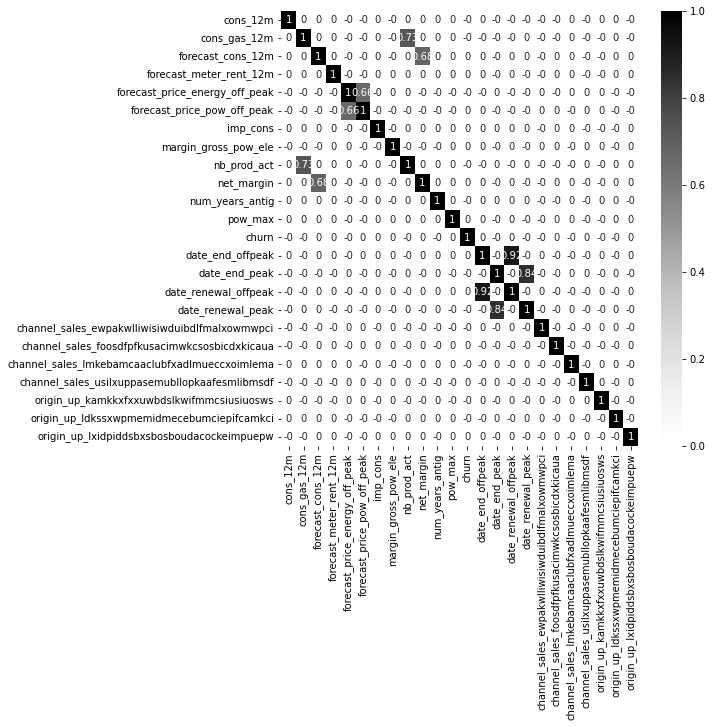

In [21]:
plt.figure(figsize=(8,8))
sb.heatmap((data.corr()>0.6)*data.corr(),cmap='Greys',annot=True)


In [22]:
#data.drop(columns=["id"],inplace=True)

<AxesSubplot:title={'center':'Spearman correlation \n with only corr > 0.6'}>

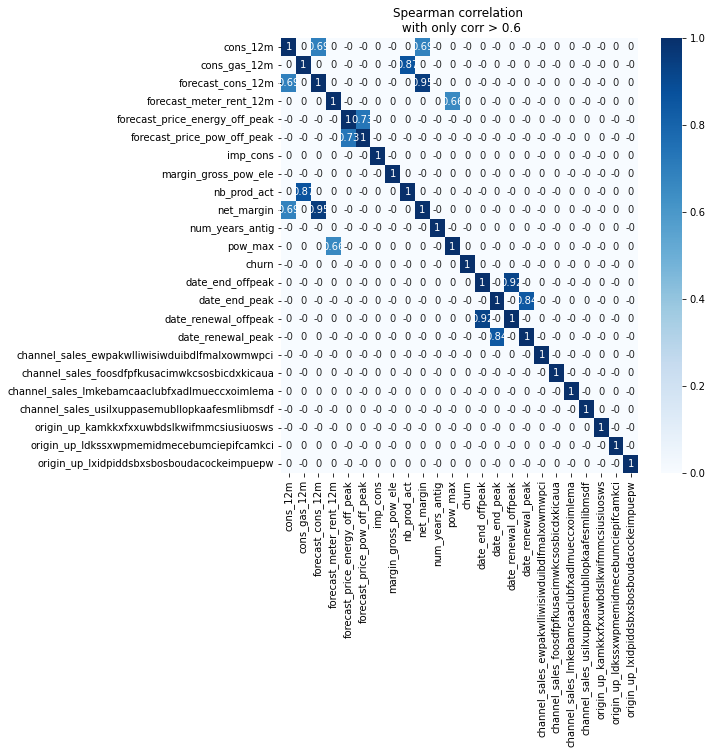

In [23]:
plt.figure(figsize=(8,8))
features=feature_corr_matrix(data.drop(columns=["id"]))
features= (features>0.6)*features
plt.title("Spearman correlation \n with only corr > 0.6");
sb.heatmap(features,cmap='Blues',annot=True)

In [24]:
data.columns

Index(['cons_12m', 'cons_gas_12m', 'forecast_cons_12m',
       'forecast_meter_rent_12m', 'forecast_price_energy_off_peak',
       'forecast_price_pow_off_peak', 'imp_cons', 'margin_gross_pow_ele',
       'nb_prod_act', 'net_margin', 'num_years_antig', 'pow_max', 'churn',
       'date_end_offpeak', 'date_end_peak', 'date_renewal_offpeak',
       'date_renewal_peak', 'id',
       'channel_sales_ewpakwlliwisiwduibdlfmalxowmwpci',
       'channel_sales_foosdfpfkusacimwkcsosbicdxkicaua',
       'channel_sales_lmkebamcaaclubfxadlmueccxoimlema',
       'channel_sales_usilxuppasemubllopkaafesmlibmsdf',
       'origin_up_kamkkxfxxuwbdslkwifmmcsiusiuosws',
       'origin_up_ldkssxwpmemidmecebumciepifcamkci',
       'origin_up_lxidpiddsbxsbosboudacockeimpuepw'],
      dtype='object')

In [25]:
columns_to_drop=["forecast_price_pow_off_peak",'date_renewal_offpeak',
       'date_renewal_peak','forecast_cons_12m', 'nb_prod_act']

data.drop(columns= columns_to_drop, inplace=True)
data.to_csv(r"data/cleaned_with_collinearity_dropped.csv")

## Extracting information from dates <a><a name='ch3'>

In [26]:
df= pd.read_csv("client_data.csv",index_col=False)
dates= ["id","date_activ","date_end","date_modif_prod","date_renewal","churn"] 
df=df[dates]
df.head()

,id,date_activ,date_end,date_modif_prod,date_renewal,churn
0,24011ae4ebbe3035111d65fa7c15bc57,2013-06-15,2016-06-15,2015-11-01,2015-06-23,1
1,d29c2c54acc38ff3c0614d0a653813dd,2009-08-21,2016-08-30,2009-08-21,2015-08-31,0
2,764c75f661154dac3a6c254cd082ea7d,2010-04-16,2016-04-16,2010-04-16,2015-04-17,0
3,bba03439a292a1e166f80264c16191cb,2010-03-30,2016-03-30,2010-03-30,2015-03-31,0
4,149d57cf92fc41cf94415803a877cb4b,2010-01-13,2016-03-07,2010-01-13,2015-03-09,0


In [27]:
df.date_end= pd.to_datetime(df.date_end)
df.date_renewal= pd.to_datetime(df.date_renewal)
df.date_activ= pd.to_datetime(df.date_activ)
df.date_modif_prod= pd.to_datetime(df.date_modif_prod)

In [28]:
df["tenure"] = ((df["date_end"]-df["date_activ"])/ np.timedelta64(1, "Y")).astype(int)

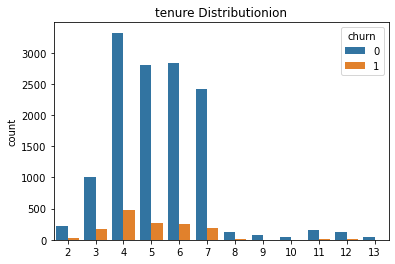

In [32]:
count_plots(df,"churn",["tenure"],[],(1,1));

In [33]:
def convert_months(ref_date, df, column):
    time_delta = ref_date - df[column]
    months = (time_delta / np.timedelta64(1, "M")).astype(int)
    return months

In [34]:
REFERENCE_DATE = datetime.datetime(2016,1,1)
df["months_activ"] = convert_months(REFERENCE_DATE, df, "date_activ")
df["months_to_end"] = -convert_months(REFERENCE_DATE, df, "date_end")
df["months_modif_prod"] = convert_months(REFERENCE_DATE, df, "date_modif_prod")
df["months_renewal"] = convert_months(REFERENCE_DATE, df, "date_renewal")

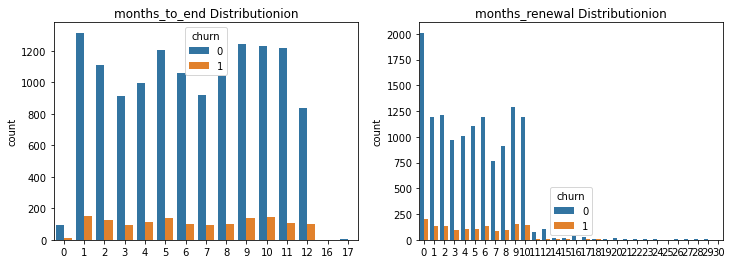

In [35]:
plt.figure(figsize=(12,4))
count_plots(df,"churn",["months_to_end","months_renewal"],[],(1,2))

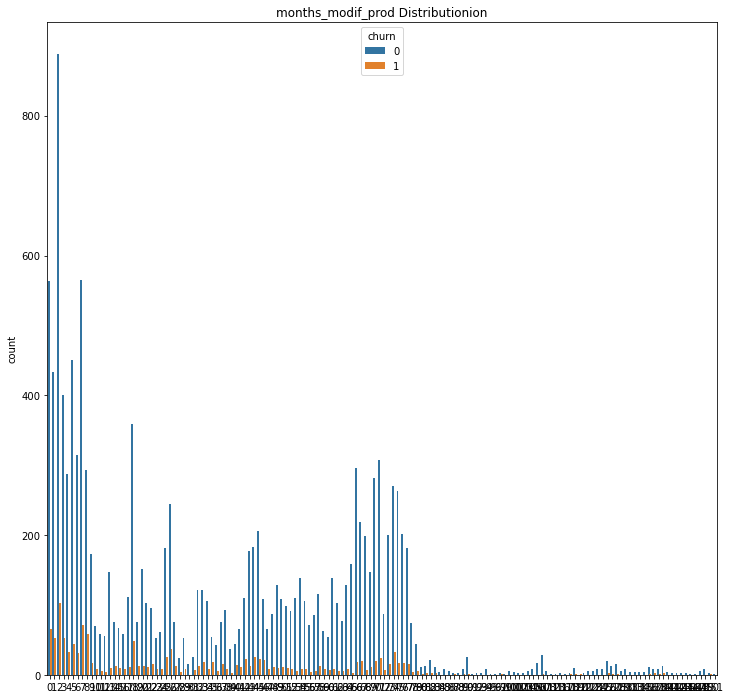

In [36]:
plt.figure(figsize=(12,12))
count_plots(df,"churn",["months_modif_prod"],[],(1,1))

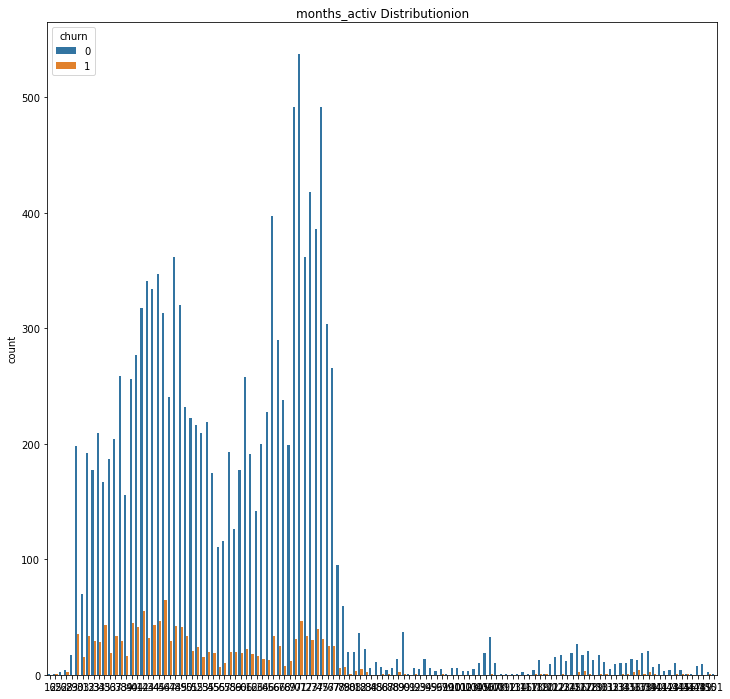

In [37]:
plt.figure(figsize=(12,12))
count_plots(df,"churn",["months_activ"],[],(1,1))

In [38]:
df.drop(columns=["churn"],inplace=True)
df=pd.merge(data,df,on='id',how='left')

<AxesSubplot:title={'center':'Spearman correlation \n with only corr > 0.6'}>

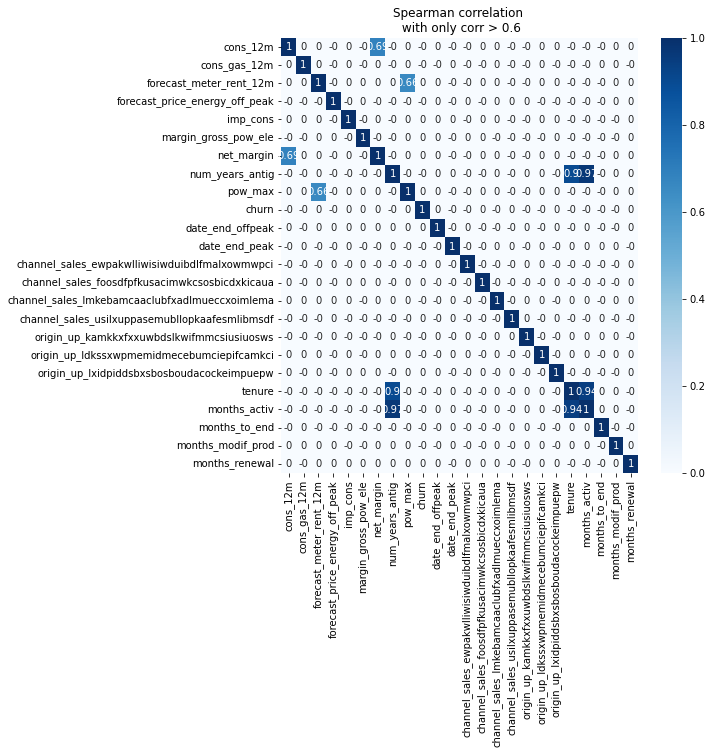

In [39]:
plt.figure(figsize=(8,8))
features=feature_corr_matrix(df.drop(columns=["id","date_activ","date_end","date_modif_prod","date_renewal"]))
features= (features>0.6)*features
plt.title("Spearman correlation \n with only corr > 0.6");
sb.heatmap(features,cmap='Blues',annot=True)

In [40]:
df.drop(columns=["date_activ","date_end","date_modif_prod","date_renewal","tenure","months_activ"],inplace=True)
df.drop(columns=["id"]).to_csv(r"data/cleaned_with_collinearity_dropped.csv",index=False)

## merging Dataframes <a><a name='ch4'>

In [41]:
price_data= pd.read_csv("price_data.csv",index_col= False)


In [42]:
mean_year=price_data.groupby(['id']).mean().reset_index()
mean_year['mean_year_price_p1']=mean_year['price_off_peak_var']+mean_year['price_off_peak_fix']
mean_year['mean_year_price_p2']=mean_year['price_peak_var']+mean_year['price_peak_fix']
mean_year['mean_year_price_p3']=mean_year['price_mid_peak_var']+mean_year['price_mid_peak_fix']
mean_year.head()

,id,price_off_peak_var,price_peak_var,price_mid_peak_var,price_off_peak_fix,price_peak_fix,price_mid_peak_fix,mean_year_price_p1,mean_year_price_p2,mean_year_price_p3
0,0002203ffbb812588b632b9e628cc38d,0.124338,0.103794,0.073160,40.701732,24.421038,16.280694,40.826071,24.524832,16.353854
1,0004351ebdd665e6ee664792efc4fd13,0.146426,0.000000,0.000000,44.385450,0.000000,0.000000,44.531877,0.000000,0.000000
2,0010bcc39e42b3c2131ed2ce55246e3c,0.181558,0.000000,0.000000,45.319710,0.000000,0.000000,45.501268,0.000000,0.000000
3,0010ee3855fdea87602a5b7aba8e42de,0.118757,0.098292,0.069032,40.647427,24.388455,16.258971,40.766185,24.486748,16.328003
4,00114d74e963e47177db89bc70108537,0.147926,0.000000,0.000000,44.266930,0.000000,0.000000,44.414856,0.000000,0.000000


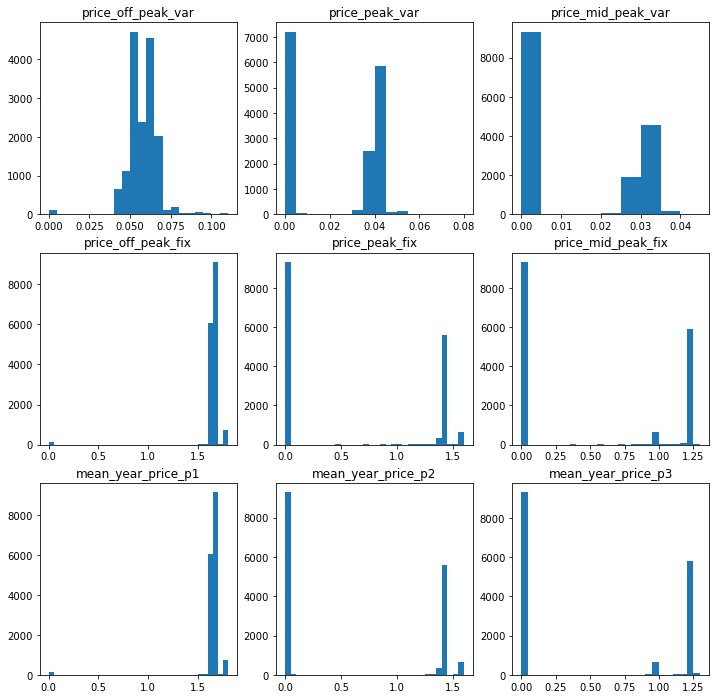

In [43]:
from utilities.eda_utility import *

plt.figure(figsize=(12,12))
titles= list(mean_year.columns)
titles.remove("id")
bins=[]
for col in titles: 
    mean_year[col]= np.log10(mean_year[col]+1)
    if col in ["price_off_peak_var","price_peak_var","price_mid_peak_var"]: 
        bins.append(np.arange(mean_year[col].min(),mean_year[col].max()+0.005,0.005))
    else: 
        bins.append(np.arange(mean_year[col].min(),mean_year[col].max()+0.05,0.05))
dsitribution_plots(data=mean_year,x=titles,titles=titles,
                   scales=["linear"]*9,bins_list=bins,order=(3,3)) 

In [44]:
columns=["mean_year_price_p1","mean_year_price_p2","mean_year_price_p3","id"]
df= pd.merge(df,mean_year[columns],on='id',how='left')
df.isna().sum()

cons_12m                                          0
cons_gas_12m                                      0
forecast_meter_rent_12m                           0
forecast_price_energy_off_peak                    0
imp_cons                                          0
margin_gross_pow_ele                              0
net_margin                                        0
num_years_antig                                   0
pow_max                                           0
churn                                             0
date_end_offpeak                                  0
date_end_peak                                     0
id                                                0
channel_sales_ewpakwlliwisiwduibdlfmalxowmwpci    0
channel_sales_foosdfpfkusacimwkcsosbicdxkicaua    0
channel_sales_lmkebamcaaclubfxadlmueccxoimlema    0
channel_sales_usilxuppasemubllopkaafesmlibmsdf    0
origin_up_kamkkxfxxuwbdslkwifmmcsiusiuosws        0
origin_up_ldkssxwpmemidmecebumciepifcamkci        0
origin_up_lx

In [45]:
df.to_csv("FE.csv",index=False)

## Trying to construct Higher order variables <a><a name='ch5'>


In [46]:
df.head()

,cons_12m,cons_gas_12m,forecast_meter_rent_12m,forecast_price_energy_off_peak,imp_cons,margin_gross_pow_ele,net_margin,num_years_antig,pow_max,churn,date_end_offpeak,date_end_peak,id,channel_sales_ewpakwlliwisiwduibdlfmalxowmwpci,channel_sales_foosdfpfkusacimwkcsosbicdxkicaua,channel_sales_lmkebamcaaclubfxadlmueccxoimlema,channel_sales_usilxuppasemubllopkaafesmlibmsdf,origin_up_kamkkxfxxuwbdslkwifmmcsiusiuosws,origin_up_ldkssxwpmemidmecebumciepifcamkci,origin_up_lxidpiddsbxsbosboudacockeimpuepw,months_to_end,months_modif_prod,months_renewal,mean_year_price_p1,mean_year_price_p2,mean_year_price_p3
0,3.668479,0.0,1.237292,0.145711,0.000000,1.240050,1.298635,6,1.170262,0,0,1,d29c2c54acc38ff3c0614d0a653813dd,0,0,0,0,1,0,0,7,76,4,1.657639,0.003083,0.000000
1,2.736397,0.0,1.599009,0.165794,0.000000,1.471292,0.880814,6,1.171902,0,0,0,764c75f661154dac3a6c254cd082ea7d,0,1,0,0,1,0,0,3,68,8,1.658545,0.036797,0.000000
2,3.200029,0.0,1.318689,0.146694,0.000000,1.494433,1.422590,6,1.152288,0,0,0,bba03439a292a1e166f80264c16191cb,0,0,1,0,1,0,0,2,69,9,1.658502,0.000000,0.000000
3,3.646011,0.0,2.122969,0.116900,1.726890,1.661907,1.690019,6,1.318063,0,1,0,149d57cf92fc41cf94415803a877cb4b,0,0,0,0,1,0,0,2,71,9,1.621304,1.406822,1.239253
4,3.919235,0.0,1.493040,0.164775,2.260572,1.533009,2.078783,4,1.152288,1,0,0,1aa498825382410b098937d65c4ec26d,0,0,0,1,0,0,1,11,2,0,1.657399,0.036482,0.000000


In [47]:
df.corr()["churn"]

cons_12m                                         -0.019687
cons_gas_12m                                     -0.024103
forecast_meter_rent_12m                           0.043637
forecast_price_energy_off_peak                   -0.014983
imp_cons                                          0.005889
margin_gross_pow_ele                              0.069733
net_margin                                        0.014948
num_years_antig                                  -0.072901
pow_max                                           0.038182
churn                                             1.000000
date_end_offpeak                                  0.007511
date_end_peak                                    -0.012023
channel_sales_ewpakwlliwisiwduibdlfmalxowmwpci   -0.011528
channel_sales_foosdfpfkusacimwkcsosbicdxkicaua    0.074856
channel_sales_lmkebamcaaclubfxadlmueccxoimlema   -0.053154
channel_sales_usilxuppasemubllopkaafesmlibmsdf    0.003829
origin_up_kamkkxfxxuwbdslkwifmmcsiusiuosws       -0.0815

In [48]:
df["cons_per_price"]= (df["cons_12m"]+df["cons_gas_12m"])/(df.mean_year_price_p1+df.mean_year_price_p2+df.mean_year_price_p3+1)
df["cons_ele_per_margin"]= df["cons_12m"]/(df["margin_gross_pow_ele"]+1)
df["cons_per_margin"]= (df["cons_12m"]+df["cons_gas_12m"])/(df["net_margin"]+1)


## Trying a model <a><a name='ch6'>

In [50]:
df.drop(columns=["id"],inplace=True)

smote = SMOTE(sampling_strategy=0.75,random_state=42)
X_train, X_test, y_train, y_test = split_x_y(df,0.3)
X_train, y_train= smote.fit_resample(X_train,y_train )


In [51]:
log_model = LogisticRegression(penalty="l1",fit_intercept=True,C=2,solver = 'liblinear', max_iter=150)
log_model.fit(X_train, y_train)
y_predict= log_model.predict(X_test)
report_scores(y_test,y_predict)

Accuracy Score: 79.79 || precision_weighted accuracy: 84.94  || recall_weighted accuracy 79.79 || f1_weighted 82.06 || Area under curve 58.42
Confusion matrix 
[[3321  589]
 [ 286  134]]


(79.79214780600462,
 84.93804554661027,
 79.79214780600462,
 82.06334094727936,
 58.42041164291803)

In [52]:
rf = RandomForestClassifier(min_samples_leaf=10,min_samples_split=10,max_depth=14)
rf.fit(X_train,y_train)
y_predict=rf.predict(X_test)
report_scores(y_test,y_predict)

Accuracy Score: 86.33 || precision_weighted accuracy: 84.79  || recall_weighted accuracy 86.33 || f1_weighted 85.51 || Area under curve 55.77
Confusion matrix 
[[3663  247]
 [ 345   75]]


(86.32794457274827,
 84.78664470436574,
 86.32794457274827,
 85.50968156534012,
 55.77000365363537)

In [53]:
df.to_csv("higher_order_data.csv",index=False)